#**KNOWLEDGE GRAPH EXPLOITATION**
**Authors**: Runxiao Qiu and Laia Jané

This is the notebook associated with the assignment **Knowledge Graph Exploitation**. In LearnSQL you can find the assignment statament, so please carefully read it while following the scripts, answering all the questions and compleating the tasks. Remember to change the **Runtime** settings to include GPU access.

Before starting, we will install and import the required libraries:

In [1]:
!pip install torch torchvision torchaudio
!pip install torch-geometric
!pip install pykeen

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.7/63.7 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 28.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.9/85.9 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 730.3/730.3 kB 27.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 419.5/419.5 kB 30.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.0/51.0 kB 5.2 MB/s eta 0:00:00


In [2]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

## **Creating the Knowledge Graph**

In [3]:
import numpy as np
from pykeen.triples import TriplesFactory
from torch_geometric.datasets import Planetoid


dataset = Planetoid(root='data/PubMed', name='PubMed')
data = dataset[0]

edge_index = data.edge_index

# Convert to numpy
heads = edge_index[0].cpu().numpy()
tails = edge_index[1].cpu().numpy()

# Create string triples
triples = np.array([
    [f"paper_{h}", "cites", f"paper_{t}"]
    for h, t in zip(heads, tails)
])

tf = TriplesFactory.from_labeled_triples(triples)

training, testing, validation = tf.split([0.8, 0.1, 0.1],random_state=2026)

INFO:pykeen.utils:Using opt_einsum
Processing...
Done!
INFO:pykeen.triples.splitting:done splitting triples to groups of sizes [51202, 8865, 8865]


## **A.1 The Most Basic Model**




In [ ]:
from pykeen.pipeline import pipeline
import pandas as pd
import matplotlib.pyplot as plt

# Train a simple, sensible TransE baseline. This is intentionally not a heavy
# hyperparameter search: A.1 is about understanding the embedding geometry.
transe_result = pipeline(
    training=training,
    testing=testing,
    validation=validation,
    model="TransE",
    model_kwargs=dict(embedding_dim=64),
    loss="MarginRankingLoss",
    loss_kwargs=dict(margin=1.0),
    optimizer="Adam",
    optimizer_kwargs=dict(lr=0.01),
    training_kwargs=dict(num_epochs=30, batch_size=4096),
    negative_sampler="basic",
    negative_sampler_kwargs=dict(num_negs_per_pos=1),
    evaluator_kwargs=dict(filtered=True),
    random_seed=2026,
    device=device.type,
)

transe_model = transe_result.model
transe_model.eval()

# Choose a deterministic paper with many outgoing citation edges, so the
# estimated query vector is based on several cited papers instead of only one.
out_degrees = np.bincount(heads, minlength=data.num_nodes)
chosen_paper_id = int(np.argmax(out_degrees))
chosen_paper = f"paper_{chosen_paper_id}"
chosen_cited_papers = [
    f"paper_{int(t)}"
    for t in tails[heads == chosen_paper_id]
    if f"paper_{int(t)}" in tf.entity_to_id
]

print(f"Chosen paper: {chosen_paper}")
print(f"Number of citation edges used: {len(chosen_cited_papers)}")

# TransE learns h + r ~= t. Therefore, if we want an embedding for a paper h'
# that cites papers similar to the selected paper's cited works, we can estimate:
#     h' ~= mean(embeddings(cited papers)) - embedding(cites)
entity_to_id = tf.entity_to_id
id_to_entity = {idx: entity for entity, idx in entity_to_id.items()}
relation_to_id = tf.relation_to_id
model_device = transe_model.device

with torch.no_grad():
    all_entity_ids = torch.arange(tf.num_entities, device=model_device)
    entity_embeddings = transe_model.entity_representations[0](indices=all_entity_ids).detach().cpu()

    cites_id = torch.as_tensor([relation_to_id["cites"]], device=model_device)
    cites_embedding = transe_model.relation_representations[0](indices=cites_id).detach().cpu()[0]

cited_ids = torch.as_tensor([entity_to_id[p] for p in chosen_cited_papers], dtype=torch.long)
mean_cited_embedding = entity_embeddings[cited_ids].mean(dim=0)
query_embedding = mean_cited_embedding - cites_embedding

distances = torch.linalg.norm(entity_embeddings - query_embedding, dim=1)

# The closest entity will often be the chosen paper itself, because the query
# is constructed from its own citation neighborhood. For the assignment, we
# report the closest *different* paper: another paper whose embedding suggests
# it cites similar works.
chosen_entity_id = entity_to_id[chosen_paper]
distances_without_chosen = distances.clone()
distances_without_chosen[chosen_entity_id] = float("inf")
nearest = torch.topk(distances_without_chosen, k=10, largest=False)

nearest_papers = pd.DataFrame({
    "rank": range(1, len(nearest.indices) + 1),
    "paper": [id_to_entity[int(i)] for i in nearest.indices],
    "distance_to_query": nearest.values.numpy(),
})

chosen_distance = float(distances[chosen_entity_id])
print(f"Distance from query to chosen paper ({chosen_paper}): {chosen_distance:.6f}")
display(nearest_papers)
print("Closest retrieved paper different from the chosen one:", nearest_papers.iloc[0]["paper"])

# Keep the TransE embeddings for later sections.
transe_entity_embeddings = entity_embeddings
transe_relation_embeddings = {"cites": cites_embedding}
best_kge_embeddings = transe_entity_embeddings

# 2D sketch of the reasoning using the actual learned embeddings.
# We include the chosen paper, a few of the papers it cites, the query vector,
# and the retrieved paper. PCA is only used to draw these high-dimensional
# vectors in 2D; the nearest-neighbor search above is done in the original space.
closest_other_paper = nearest_papers.iloc[0]["paper"]
closest_other_id = entity_to_id[closest_other_paper]

num_cited_to_plot = min(6, len(chosen_cited_papers))
# Pick cited papers spread through the citation list so the sketch is not based
# only on the first few edges returned by the dataset.
plot_positions = np.linspace(0, len(chosen_cited_papers) - 1, num_cited_to_plot, dtype=int)
plotted_cited_papers = [chosen_cited_papers[i] for i in plot_positions]
plotted_cited_ids = [entity_to_id[p] for p in plotted_cited_papers]

selected_vectors = torch.vstack([
    entity_embeddings[entity_to_id[chosen_paper]].unsqueeze(0),
    entity_embeddings[closest_other_id].unsqueeze(0),
    query_embedding.unsqueeze(0),
    mean_cited_embedding.unsqueeze(0),
    entity_embeddings[plotted_cited_ids],
]).numpy()

labels = (
    [f"chosen {chosen_paper}", f"retrieved {closest_other_paper}", "query vector", "mean cited papers"]
    + [f"cited {p}" for p in plotted_cited_papers]
)

# PCA to 2D, implemented directly with SVD to avoid another dependency.
center = selected_vectors.mean(axis=0, keepdims=True)
centered = selected_vectors - center
_, _, vh = np.linalg.svd(centered, full_matrices=False)
components = vh[:2]
points_2d = centered @ components.T
relation_2d = cites_embedding.numpy() @ components.T

chosen_xy = points_2d[0]
retrieved_xy = points_2d[1]
query_xy = points_2d[2]
mean_cited_xy = points_2d[3]
cited_xy = points_2d[4:]

INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()


Training epochs on cuda:0:   0%|          | 0/30 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 2.50s seconds


Chosen paper: paper_11450
Number of citation edges used: 171
Distance from query to chosen paper (paper_11450): 0.673351


,rank,paper,distance_to_query
0,1,paper_11449,0.784873
1,2,paper_11024,0.787090
2,3,paper_15916,0.798480
3,4,paper_6164,0.800327
4,5,paper_12256,0.801382
5,6,paper_616,0.805056
6,7,paper_4051,0.812045
7,8,paper_9634,0.819918
8,9,paper_1794,0.825437
9,10,paper_10243,0.825671


Closest retrieved paper different from the chosen one: paper_11449


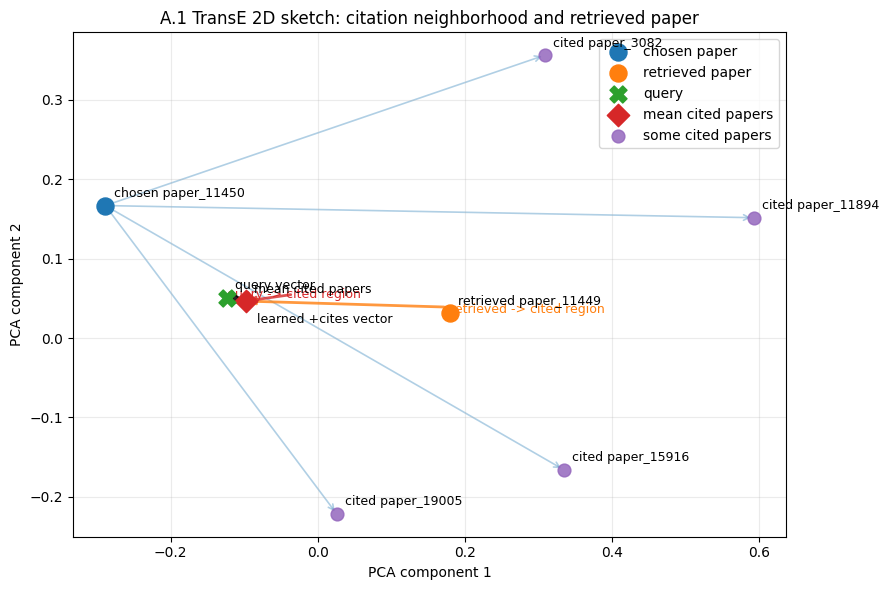

In [ ]:
# Remove two visually unhelpful cited-paper examples:
# the leftmost cited node and the lowest cited node.
remove_idx = set()
remove_idx.add(int(np.argmin(cited_xy[:, 0])))  # leftmost cited paper
remove_idx.add(int(np.argmin(cited_xy[:, 1])))  # bottom cited paper

keep_idx = [i for i in range(len(cited_xy)) if i not in remove_idx]
visible_cited_xy = cited_xy[keep_idx]
visible_cited_labels = [f"cited {plotted_cited_papers[i]}" for i in keep_idx]

plt.figure(figsize=(9, 6))
plt.scatter(chosen_xy[0], chosen_xy[1], s=150, label="chosen paper", zorder=4)
plt.scatter(retrieved_xy[0], retrieved_xy[1], s=150, label="retrieved paper", zorder=4)
plt.scatter(query_xy[0], query_xy[1], s=150, marker="X", label="query", zorder=5)
plt.scatter(mean_cited_xy[0], mean_cited_xy[1], s=130, marker="D", label="mean cited papers", zorder=4)
plt.scatter(
    visible_cited_xy[:, 0],
    visible_cited_xy[:, 1],
    s=85,
    alpha=0.85,
    label="some cited papers",
    zorder=4,
)

# Citation arrows: chosen paper -> selected visible papers it cites.
for target_xy in visible_cited_xy:
    plt.annotate(
        "",
        xy=target_xy,
        xytext=chosen_xy,
        arrowprops=dict(arrowstyle="->", color="tab:blue", alpha=0.35, lw=1.2),
        zorder=1,
    )

# Similarity arrows: retrieved/query paper -> the same cited-paper region.
for source_xy, color, label in [
    (retrieved_xy, "tab:orange", "retrieved -> cited region"),
    (query_xy, "tab:red", "query -> cited region"),
]:
    plt.annotate(
        label,
        xy=mean_cited_xy,
        xytext=source_xy,
        arrowprops=dict(arrowstyle="->", color=color, alpha=0.8, lw=2.0),
        color=color,
        fontsize=9,
    )

# Learned TransE relation vector shown from the query point.
plt.arrow(
    query_xy[0], query_xy[1], relation_2d[0], relation_2d[1],
    width=0.004,
    length_includes_head=True,
    alpha=0.85,
    color="black",
    zorder=3,
)
plt.annotate(
    "learned +cites vector",
    query_xy + relation_2d,
    xytext=(8, -16),
    textcoords="offset points",
    fontsize=9,
    color="black",
)

main_points = [chosen_xy, retrieved_xy, query_xy, mean_cited_xy]
main_labels = [
    f"chosen {chosen_paper}",
    f"retrieved {closest_other_paper}",
    "query vector",
    "mean cited papers",
]

for xy, label in zip(main_points, main_labels):
    plt.annotate(label, xy, xytext=(6, 6), textcoords="offset points", fontsize=9, zorder=6)

for xy, label in zip(visible_cited_xy, visible_cited_labels):
    plt.annotate(label, xy, xytext=(6, 6), textcoords="offset points", fontsize=9, zorder=6)

plt.title("A.1 TransE 2D sketch: citation neighborhood and retrieved paper")
plt.xlabel("PCA component 1")
plt.ylabel("PCA component 2")
plt.legend(loc="best")
plt.grid(alpha=0.25)
plt.tight_layout()
plt.show()

### A.1 answer

A simple TransE model was trained with 64-dimensional embeddings, and paper_11450 was selected because it has 171 outgoing citation edges. TransE represents each triple as `head + relation ~= tail`. For the selected paper h, we took the embeddings of the papers it cites, averaged them to obtain a representative cited-paper vector t, and then estimated the embedding of another paper that would cite similar works as t−cites, following the TransE translation principle.

The resulting query vector was compared against all paper embeddings using Euclidean distance. Since the query vector is constructed from the chosen paper’s own citation neighborhood, the closest embedding can naturally be the original paper itself. The distance between the generated query vector and paper_11450 was 0.673351, which serves as a sanity check. Excluding the original paper, the closest retrieved paper was paper_11449 with a distance of 0.784873. Other nearby papers included paper_11024 (0.787090) and paper_15916 (0.798480). This indicates that the embedding space successfully groups papers with similar citation behavior close together.

The 2D sketch projects the relevant learned vectors: the selected paper, several cited papers, the averaged cited-paper vector, the generated query vector, and the retrieved paper. The arrows represent the learned cites relation direction; according to TransE, adding the relation vector to a citing paper embedding should move it toward the region occupied by the cited papers.





## **A.2 Improving TransE**

In [ ]:
# We look for real examples in our PubMed graph where TransE has difficulties.
# The only relation is "cites", so every triple has the form:
# paper_i --cites--> paper_j

# One-to-many: one paper cites many different papers
out_degrees = np.bincount(heads, minlength=data.num_nodes)
one_to_many_head = int(np.argmax(out_degrees))
one_to_many_tails = tails[heads == one_to_many_head]

# Many-to-one: many different papers cite the same paper
in_degrees = np.bincount(tails, minlength=data.num_nodes)
many_to_one_tail = int(np.argmax(in_degrees))
many_to_one_heads = heads[tails == many_to_one_tail]

one_to_many_examples = pd.DataFrame({
    "head": [f"paper_{one_to_many_head}"] * min(3, len(one_to_many_tails)),
    "relation": ["cites"] * min(3, len(one_to_many_tails)),
    "tail": [f"paper_{int(t)}" for t in one_to_many_tails[:3]],
})

many_to_one_examples = pd.DataFrame({
    "head": [f"paper_{int(h)}" for h in many_to_one_heads[:3]],
    "relation": ["cites"] * min(3, len(many_to_one_heads)),
    "tail": [f"paper_{many_to_one_tail}"] * min(3, len(many_to_one_heads)),
})

print(f"One-to-many example: paper_{one_to_many_head} cites {len(one_to_many_tails)} papers")
display(one_to_many_examples)

print(f"Many-to-one example: paper_{many_to_one_tail} is cited by {len(many_to_one_heads)} papers")
display(many_to_one_examples)

One-to-many example: paper_11450 cites 171 papers


,head,relation,tail
0,paper_11450,cites,paper_46
1,paper_11450,cites,paper_62
2,paper_11450,cites,paper_351


Many-to-one example: paper_11450 is cited by 171 papers


,head,relation,tail
0,paper_46,cites,paper_11450
1,paper_62,cites,paper_11450
2,paper_351,cites,paper_11450



TransE models each triple as: `head + relation ≈ tail`

In our graph, the only relation is `cites`, so each citation is represented as: `paper_i + cites ≈ paper_j`

This works well when a relation behaves almost like a simple translation. However, in PubMed the relation `cites` is many-to-many. One paper can cite many different papers, and one paper can also be cited by many different papers.

For example, in a one-to-many case we may have:

`paper_i + cites ≈ paper_a`  
`paper_i + cites ≈ paper_b`  
`paper_i + cites ≈ paper_c`

The problem is that the left side is always the same vector, `paper_i + cites`. Therefore, TransE is pushed to place `paper_a`, `paper_b` and `paper_c` close together, even if they are different papers.

The same happens in the many-to-one case:

`paper_a + cites ≈ paper_j`  
`paper_b + cites ≈ paper_j`  
`paper_c + cites ≈ paper_j`

Here, TransE may force the citing papers to become too similar just because they cite the same paper.

A model that improves this limitation is **TransH**. TransH keeps the intuition of TransE, but instead of using the original entity embeddings directly, it projects entities onto a relation-specific hyperplane. Then the translation is applied inside that hyperplane.

This helps because the same entity can have different projected representations depending on the relation. In other words, TransH gives the model more flexibility than TransE, so it can better represent one-to-many, many-to-one and many-to-many patterns.

In our case, this is useful because `cites` is not a one-to-one relation. Papers can cite several works, and popular papers can be cited by many different papers. TransH can reduce the embedding collapse problem that appears in TransE, where several heads or tails are forced to be too close together.

## **A.3 Training KGEs**

### A.3.1 Helper functions

This cell only defines utilities. It keeps the training code shorter and extracts the PyKEEN metrics we need for the report.


In [4]:
import pandas as pd
import torch
from pykeen.pipeline import pipeline

def get_metric(metric_dict, metric_name):
    """Small helper because PyKEEN stores metric names with long prefixes."""
    possible_keys = [
        f"both.realistic.{metric_name}",
        f"both.optimistic.{metric_name}",
        f"both.pessimistic.{metric_name}",
        metric_name,
    ]

    for key in possible_keys:
        if key in metric_dict:
            return metric_dict[key]

    for key, value in metric_dict.items():
        if key.endswith(metric_name):
            return value

    return None


def train_kge_model(
    model_name,
    embedding_dim=64,
    num_epochs=20,
    num_negs_per_pos=1,
    margin=1.0,
    lr=0.01,
    random_seed=2026,
):
    """Train one KGE model and return both the PyKEEN result and the metrics row."""
    print(
        f"\nTraining {model_name} | dim={embedding_dim}, "
        f"negatives={num_negs_per_pos}, margin={margin}"
    )

    result = pipeline(
        training=training,
        testing=testing,
        validation=validation,
        model=model_name,
        model_kwargs=dict(embedding_dim=embedding_dim),
        loss="MarginRankingLoss",
        loss_kwargs=dict(margin=margin),
        optimizer="Adam",
        optimizer_kwargs=dict(lr=lr),
        training_kwargs=dict(
            num_epochs=num_epochs,
            batch_size=4096,
        ),
        negative_sampler="basic",
        negative_sampler_kwargs=dict(num_negs_per_pos=num_negs_per_pos),
        evaluator_kwargs=dict(filtered=True),
        random_seed=random_seed,
        device=device.type,
    )

    metrics = result.metric_results.to_flat_dict()

    row = {
        "model": model_name,
        "embedding_dim": embedding_dim,
        "num_epochs": num_epochs,
        "num_negs_per_pos": num_negs_per_pos,
        "margin": margin,
        "Hits@1": get_metric(metrics, "hits_at_1"),
        "Hits@3": get_metric(metrics, "hits_at_3"),
        "MRR": get_metric(metrics, "inverse_harmonic_mean_rank"),
    }

    return result, row


### A.3.2 Models we compare

Here we choose the models. We leave TransE out of this comparison because it was already used in A.1 and its limitations were the point of A.2. Instead, we compare two stronger translational models and two semantic matching models.


In [ ]:
# We do not tune TransE here because we already used it in A.1 and discussed its
# limitations in A.2. Instead, we compare stronger alternatives.

models_to_train = [
    {
        "model": "TransH",
        "family": "Translational",
        "why": "Improves TransE by projecting entities onto a relation-specific hyperplane.",
    },
    {
        "model": "RotatE",
        "family": "Translational",
        "why": "Models relations as rotations, which is more flexible than a plain translation.",
    },
    {
        "model": "DistMult",
        "family": "Semantic matching",
        "why": "Simple semantic baseline that scores triples through entity-relation compatibility.",
    },
    {
        "model": "ComplEx",
        "family": "Semantic matching",
        "why": "More expressive semantic model; useful for asymmetric relations such as citations.",
    },
]

pd.DataFrame(models_to_train)


,model,family,why
0,TransH,Translational,Improves TransE by projecting entities onto a ...
1,RotatE,Translational,"Models relations as rotations, which is more f..."
2,DistMult,Semantic matching,Simple semantic baseline that scores triples t...
3,ComplEx,Semantic matching,More expressive semantic model; useful for asy...


### A.3.2 Parameter sweeps

We tune every model with the same small set of experiments. We change one parameter at a time so the effect is easier to explain later.


In [ ]:
# For each model we change one parameter at a time. This is much easier to
# interpret than a full grid, and it keeps the runtime reasonable.
parameter_sweeps = []

for dim in [32, 64, 128]:
    parameter_sweeps.append({
        "experiment": "embedding_dim",
        "value": dim,
        "embedding_dim": dim,
        "num_negs_per_pos": 1,
        "margin": 1.0,
    })

for num_negs in [1, 5, 10]:
    parameter_sweeps.append({
        "experiment": "num_negs_per_pos",
        "value": num_negs,
        "embedding_dim": 64,
        "num_negs_per_pos": num_negs,
        "margin": 1.0,
    })

for margin in [0.5, 1.0, 2.0]:
    parameter_sweeps.append({
        "experiment": "margin",
        "value": margin,
        "embedding_dim": 64,
        "num_negs_per_pos": 1,
        "margin": margin,
    })

parameter_sweeps = pd.DataFrame(parameter_sweeps)
parameter_sweeps


,experiment,value,embedding_dim,num_negs_per_pos,margin
0,embedding_dim,32.0,32,1,1.0
1,embedding_dim,64.0,64,1,1.0
2,embedding_dim,128.0,128,1,1.0
3,num_negs_per_pos,1.0,64,1,1.0
4,num_negs_per_pos,5.0,64,5,1.0
5,num_negs_per_pos,10.0,64,10,1.0
6,margin,0.5,64,1,0.5
7,margin,1.0,64,1,1.0
8,margin,2.0,64,1,2.0


### A.3.3 Tune all models

This is the long-running cell. It trains every selected model under each parameter setting and stores the metrics in one table.


In [ ]:
tuning_rows = []

for model_info in models_to_train:
    model_name = model_info["model"]

    for _, config in parameter_sweeps.iterrows():
        try:
            _, row = train_kge_model(
                model_name=model_name,
                embedding_dim=int(config["embedding_dim"]),
                num_epochs=20,
                num_negs_per_pos=int(config["num_negs_per_pos"]),
                margin=float(config["margin"]),
                lr=0.01,
            )

            row["family"] = model_info["family"]
            row["experiment"] = config["experiment"]
            row["value"] = config["value"]
            tuning_rows.append(row)

        except Exception as e:
            # If one model/configuration fails, we keep the notebook running and
            # record the issue instead of losing all previous experiments.
            tuning_rows.append({
                "model": model_name,
                "family": model_info["family"],
                "experiment": config["experiment"],
                "value": config["value"],
                "embedding_dim": int(config["embedding_dim"]),
                "num_epochs": 20,
                "num_negs_per_pos": int(config["num_negs_per_pos"]),
                "margin": float(config["margin"]),
                "Hits@1": None,
                "Hits@3": None,
                "MRR": None,
                "error": str(e),
            })
            print(f"Skipping failed run for {model_name}: {e}")

tuning_results = pd.DataFrame(tuning_rows)
tuning_results


INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()



Training TransH | dim=32, negatives=1, margin=1.0


Training epochs on cuda:0:   0%|          | 0/20 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 3.79s seconds
INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()



Training TransH | dim=64, negatives=1, margin=1.0


Training epochs on cuda:0:   0%|          | 0/20 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 5.22s seconds
INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()



Training TransH | dim=128, negatives=1, margin=1.0


Training epochs on cuda:0:   0%|          | 0/20 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 7.87s seconds
INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()



Training TransH | dim=64, negatives=1, margin=1.0


Training epochs on cuda:0:   0%|          | 0/20 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 5.11s seconds
INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()



Training TransH | dim=64, negatives=5, margin=1.0


Training epochs on cuda:0:   0%|          | 0/20 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 5.38s seconds
INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()



Training TransH | dim=64, negatives=10, margin=1.0


Training epochs on cuda:0:   0%|          | 0/20 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 5.07s seconds
INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()



Training TransH | dim=64, negatives=1, margin=0.5


Training epochs on cuda:0:   0%|          | 0/20 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 5.10s seconds
INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()



Training TransH | dim=64, negatives=1, margin=1.0


Training epochs on cuda:0:   0%|          | 0/20 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 5.36s seconds
INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()



Training TransH | dim=64, negatives=1, margin=2.0


Training epochs on cuda:0:   0%|          | 0/20 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 5.10s seconds
INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()



Training RotatE | dim=32, negatives=1, margin=1.0


Training epochs on cuda:0:   0%|          | 0/20 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 2.56s seconds
INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()



Training RotatE | dim=64, negatives=1, margin=1.0


Training epochs on cuda:0:   0%|          | 0/20 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 3.29s seconds
INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()



Training RotatE | dim=128, negatives=1, margin=1.0


Training epochs on cuda:0:   0%|          | 0/20 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 5.30s seconds
INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()



Training RotatE | dim=64, negatives=1, margin=1.0


Training epochs on cuda:0:   0%|          | 0/20 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 3.43s seconds
INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()



Training RotatE | dim=64, negatives=5, margin=1.0


Training epochs on cuda:0:   0%|          | 0/20 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 3.23s seconds
INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()



Training RotatE | dim=64, negatives=10, margin=1.0


Training epochs on cuda:0:   0%|          | 0/20 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 3.31s seconds
INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()



Training RotatE | dim=64, negatives=1, margin=0.5


Training epochs on cuda:0:   0%|          | 0/20 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 3.25s seconds
INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()



Training RotatE | dim=64, negatives=1, margin=1.0


Training epochs on cuda:0:   0%|          | 0/20 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 3.21s seconds
INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()



Training RotatE | dim=64, negatives=1, margin=2.0


Training epochs on cuda:0:   0%|          | 0/20 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 3.26s seconds
INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding(
  (regularizer): LpRegularizer()
)



Training DistMult | dim=32, negatives=1, margin=1.0


Training epochs on cuda:0:   0%|          | 0/20 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 2.09s seconds
INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding(
  (regularizer): LpRegularizer()
)



Training DistMult | dim=64, negatives=1, margin=1.0


Training epochs on cuda:0:   0%|          | 0/20 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 2.52s seconds
INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding(
  (regularizer): LpRegularizer()
)



Training DistMult | dim=128, negatives=1, margin=1.0


Training epochs on cuda:0:   0%|          | 0/20 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 3.31s seconds
INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding(
  (regularizer): LpRegularizer()
)



Training DistMult | dim=64, negatives=1, margin=1.0


Training epochs on cuda:0:   0%|          | 0/20 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 2.51s seconds
INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding(
  (regularizer): LpRegularizer()
)



Training DistMult | dim=64, negatives=5, margin=1.0


Training epochs on cuda:0:   0%|          | 0/20 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 2.53s seconds
INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding(
  (regularizer): LpRegularizer()
)



Training DistMult | dim=64, negatives=10, margin=1.0


Training epochs on cuda:0:   0%|          | 0/20 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 2.72s seconds
INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding(
  (regularizer): LpRegularizer()
)



Training DistMult | dim=64, negatives=1, margin=0.5


Training epochs on cuda:0:   0%|          | 0/20 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 2.75s seconds
INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding(
  (regularizer): LpRegularizer()
)



Training DistMult | dim=64, negatives=1, margin=1.0


Training epochs on cuda:0:   0%|          | 0/20 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 2.55s seconds
INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding(
  (regularizer): LpRegularizer()
)



Training DistMult | dim=64, negatives=1, margin=2.0


Training epochs on cuda:0:   0%|          | 0/20 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 2.57s seconds
INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding(
  (regularizer): LpRegularizer()
)
INFO:pykeen.nn.representation:Inferred unique=False for Embedding(
  (regularizer): LpRegularizer()
)



Training ComplEx | dim=32, negatives=1, margin=1.0


Training epochs on cuda:0:   0%|          | 0/20 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 1.65s seconds
INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding(
  (regularizer): LpRegularizer()
)
INFO:pykeen.nn.representation:Inferred unique=False for Embedding(
  (regularizer): LpRegularizer()
)



Training ComplEx | dim=64, negatives=1, margin=1.0


Training epochs on cuda:0:   0%|          | 0/20 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 1.96s seconds
INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding(
  (regularizer): LpRegularizer()
)
INFO:pykeen.nn.representation:Inferred unique=False for Embedding(
  (regularizer): LpRegularizer()
)



Training ComplEx | dim=128, negatives=1, margin=1.0


Training epochs on cuda:0:   0%|          | 0/20 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 3.32s seconds
INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding(
  (regularizer): LpRegularizer()
)
INFO:pykeen.nn.representation:Inferred unique=False for Embedding(
  (regularizer): LpRegularizer()
)



Training ComplEx | dim=64, negatives=1, margin=1.0


Training epochs on cuda:0:   0%|          | 0/20 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 2.20s seconds
INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding(
  (regularizer): LpRegularizer()
)
INFO:pykeen.nn.representation:Inferred unique=False for Embedding(
  (regularizer): LpRegularizer()
)



Training ComplEx | dim=64, negatives=5, margin=1.0


Training epochs on cuda:0:   0%|          | 0/20 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 1.90s seconds
INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding(
  (regularizer): LpRegularizer()
)
INFO:pykeen.nn.representation:Inferred unique=False for Embedding(
  (regularizer): LpRegularizer()
)



Training ComplEx | dim=64, negatives=10, margin=1.0


Training epochs on cuda:0:   0%|          | 0/20 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 1.98s seconds
INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding(
  (regularizer): LpRegularizer()
)
INFO:pykeen.nn.representation:Inferred unique=False for Embedding(
  (regularizer): LpRegularizer()
)



Training ComplEx | dim=64, negatives=1, margin=0.5


Training epochs on cuda:0:   0%|          | 0/20 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 2.21s seconds
INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding(
  (regularizer): LpRegularizer()
)
INFO:pykeen.nn.representation:Inferred unique=False for Embedding(
  (regularizer): LpRegularizer()
)



Training ComplEx | dim=64, negatives=1, margin=1.0


Training epochs on cuda:0:   0%|          | 0/20 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 1.92s seconds
INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding(
  (regularizer): LpRegularizer()
)
INFO:pykeen.nn.representation:Inferred unique=False for Embedding(
  (regularizer): LpRegularizer()
)



Training ComplEx | dim=64, negatives=1, margin=2.0


Training epochs on cuda:0:   0%|          | 0/20 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 1.92s seconds


,model,embedding_dim,num_epochs,num_negs_per_pos,margin,Hits@1,Hits@3,MRR,family,experiment,value
0,TransH,32,20,1,1.0,0.001015,0.004061,0.007122,Translational,embedding_dim,32.0
1,TransH,64,20,1,1.0,0.001241,0.004681,0.007265,Translational,embedding_dim,64.0
2,TransH,128,20,1,1.0,0.001410,0.004963,0.007637,Translational,embedding_dim,128.0
3,TransH,64,20,1,1.0,0.001241,0.004681,0.007265,Translational,num_negs_per_pos,1.0
4,TransH,64,20,5,1.0,0.001692,0.007107,0.011283,Translational,num_negs_per_pos,5.0
5,TransH,64,20,10,1.0,0.001692,0.008742,0.013805,Translational,num_negs_per_pos,10.0
6,TransH,64,20,1,0.5,0.001579,0.008178,0.012660,Translational,margin,0.5
7,TransH,64,20,1,1.0,0.001241,0.004681,0.007265,Translational,margin,1.0
8,TransH,64,20,1,2.0,0.000620,0.002143,0.004144,Translational,margin,2.0
9,RotatE,32,20,1,1.0,0.319459,0.426509,0.395839,Translational,embedding_dim,32.0


### A.3.4 Best configuration per model

After tuning, we keep the best configuration of each model according to MRR. This gives each model a fairer final comparison.


In [ ]:
# Pick the best configuration for each model according to MRR.
valid_tuning_results = tuning_results.dropna(subset=["MRR"]).copy()

best_config_per_model = (
    valid_tuning_results
    .sort_values("MRR", ascending=False)
    .groupby("model", as_index=False)
    .first()
)

best_config_per_model[
    ["model", "family", "embedding_dim", "num_negs_per_pos", "margin", "Hits@1", "Hits@3", "MRR"]
].sort_values("MRR", ascending=False)


,model,family,embedding_dim,num_negs_per_pos,margin,Hits@1,Hits@3,MRR
2,RotatE,Translational,64,10,1.0,0.597067,0.699210,0.662562
1,DistMult,Semantic matching,128,1,1.0,0.364580,0.479244,0.447638
3,TransH,Translational,64,10,1.0,0.001692,0.008742,0.013805
0,ComplEx,Semantic matching,64,10,1.0,0.000508,0.001579,0.003554


### A.3.5 Final tuned comparison

Now we retrain each model once with its best configuration.

In [ ]:
# Now we retrain each model once using its best observed configuration.
# These are the results we use for the final model comparison.
final_results = {}
final_rows = []

for _, config in best_config_per_model.iterrows():
    model_name = config["model"]

    result, row = train_kge_model(
        model_name=model_name,
        embedding_dim=int(config["embedding_dim"]),
        num_epochs=30,
        num_negs_per_pos=int(config["num_negs_per_pos"]),
        margin=float(config["margin"]),
        lr=0.01,
    )

    row["family"] = config["family"]
    final_results[model_name] = result
    final_rows.append(row)

final_comparison = pd.DataFrame(final_rows)
final_comparison.sort_values("MRR", ascending=False)


INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding(
  (regularizer): LpRegularizer()
)
INFO:pykeen.nn.representation:Inferred unique=False for Embedding(
  (regularizer): LpRegularizer()
)



Training ComplEx | dim=64, negatives=10, margin=1.0


Training epochs on cuda:0:   0%|          | 0/30 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 1.93s seconds
INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding(
  (regularizer): LpRegularizer()
)



Training DistMult | dim=128, negatives=1, margin=1.0


Training epochs on cuda:0:   0%|          | 0/30 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 3.27s seconds
INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()



Training RotatE | dim=64, negatives=10, margin=1.0


Training epochs on cuda:0:   0%|          | 0/30 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 3.25s seconds
INFO:pykeen.pipeline.api:Using device: cuda
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()



Training TransH | dim=64, negatives=10, margin=1.0


Training epochs on cuda:0:   0%|          | 0/30 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/18.0 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/8.87k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 4.20s seconds


,model,embedding_dim,num_epochs,num_negs_per_pos,margin,Hits@1,Hits@3,MRR,family
2,RotatE,64,30,10,1.0,0.634010,0.732882,0.695565,Translational
1,DistMult,128,30,1,1.0,0.327186,0.453356,0.419401,Semantic matching
3,TransH,64,30,10,1.0,0.001974,0.009306,0.014239,Translational
0,ComplEx,64,30,10,1.0,0.001015,0.002820,0.006136,Semantic matching


### A.3.6 Keep the best embeddings

Store the entity embeddings of the best final model.


In [ ]:
# Keep the overall best embeddings for later parts of the lab.
best_row = final_comparison.sort_values("MRR", ascending=False).iloc[0]
best_model_name = best_row["model"]
best_kge_result = final_results[best_model_name]
best_kge_model = best_kge_result.model

print("Best model according to MRR:", best_model_name)
display(best_row.to_frame().T)

best_kge_model.eval()

with torch.no_grad():
    entity_ids = torch.arange(tf.num_entities, device=best_kge_model.device)
    best_kge_embeddings = (
        best_kge_model
        .entity_representations[0](indices=entity_ids)
        .detach()
        .cpu()
    )

print("Best KGE embeddings shape:", best_kge_embeddings.shape)


Best model according to MRR: RotatE


,model,embedding_dim,num_epochs,num_negs_per_pos,margin,Hits@1,Hits@3,MRR,family
2,RotatE,64,30,10,1.0,0.63401,0.732882,0.695565,Translational


Best KGE embeddings shape: torch.Size([19717, 64])


### A.3.8 Tables for the report

These tables are just arranged in a cleaner way so they are easier to copy into the PDF.


In [ ]:
print("Final tuned model comparison:")
display(
    final_comparison[
        ["model", "family", "embedding_dim", "num_negs_per_pos", "margin", "Hits@1", "Hits@3", "MRR"]
    ].sort_values("MRR", ascending=False)
)

print("Parameter sweeps by model:")
display(
    tuning_results[
        ["model", "experiment", "value", "embedding_dim", "num_negs_per_pos", "margin", "Hits@1", "Hits@3", "MRR"]
    ].sort_values(["model", "experiment", "value"])
)


Final tuned model comparison:


,model,family,embedding_dim,num_negs_per_pos,margin,Hits@1,Hits@3,MRR
2,RotatE,Translational,64,10,1.0,0.634010,0.732882,0.695565
1,DistMult,Semantic matching,128,1,1.0,0.327186,0.453356,0.419401
3,TransH,Translational,64,10,1.0,0.001974,0.009306,0.014239
0,ComplEx,Semantic matching,64,10,1.0,0.001015,0.002820,0.006136


Parameter sweeps by model:


,model,experiment,value,embedding_dim,num_negs_per_pos,margin,Hits@1,Hits@3,MRR
27,ComplEx,embedding_dim,32.0,32,1,1.0,0.000338,0.000790,0.001877
28,ComplEx,embedding_dim,64.0,64,1,1.0,0.000282,0.000451,0.001479
29,ComplEx,embedding_dim,128.0,128,1,1.0,0.000564,0.001748,0.002983
33,ComplEx,margin,0.5,64,1,0.5,0.000169,0.000338,0.001205
34,ComplEx,margin,1.0,64,1,1.0,0.000282,0.000451,0.001479
35,ComplEx,margin,2.0,64,1,2.0,0.000282,0.000508,0.001915
30,ComplEx,num_negs_per_pos,1.0,64,1,1.0,0.000282,0.000451,0.001479
31,ComplEx,num_negs_per_pos,5.0,64,5,1.0,0.000451,0.001128,0.002922
32,ComplEx,num_negs_per_pos,10.0,64,10,1.0,0.000508,0.001579,0.003554
18,DistMult,embedding_dim,32.0,32,1,1.0,0.242019,0.343204,0.322707


### A.3 answer

For this section we did not focus on TransE again. We already used TransE in A.1 and, in A.2, we discussed why it is limited for the PubMed citation graph. Instead, we trained four alternatives: **TransH**, **RotatE**, **DistMult** and **ComplEx**.

The idea was to compare two model families. **TransH** and **RotatE** are closer to the translational family, so they are natural improvements after TransE. **DistMult** and **ComplEx** are semantic matching models, so they score whether a head, relation and tail are compatible rather than representing the relation only as a simple displacement.

We tuned all four models using the same strategy. For each model, we varied one parameter at a time: embedding dimension, number of negative samples per positive sample, and loss margin. Then, for each model, we selected the configuration with the best MRR and retrained it once more. The final comparison table reports these tuned results.

The best model was **RotatE**, with:

`Hits@1 = 0.634010`  
`Hits@3 = 0.732882`  
`MRR = 0.695565`

This was clearly the strongest result. The second-best model was **DistMult**, with `MRR = 0.419401`, while **TransH** and **ComplEx** obtained much lower scores in our setup. This means that RotatE ranked the correct paper much higher on average, and it also placed the correct answer in the top 3 for around 73% of the evaluated cases.

MRR is the main metric we used to choose the best model because it tells us how high the correct entity appears in the ranking on average. Hits@1 and Hits@3 are stricter top-k measures: they tell us whether the correct entity appears exactly in the first position or within the first three positions.

#### Effect of embedding dimension

Increasing the embedding dimension generally helped the stronger models. For **RotatE**, MRR increased from `0.395839` with 32 dimensions to `0.566399` with 64 dimensions and `0.645046` with 128 dimensions. **DistMult** followed the same tendency, improving from `0.322707` to `0.447638`. This suggests that these models benefited from having more capacity to represent the citation structure.

For **TransH** and **ComplEx**, the effect was much smaller because their overall performance was already very low in this configuration. ComplEx improved slightly with 128 dimensions, but it was still far from RotatE and DistMult.

#### Effect of negative samples

Negative samples had a very clear effect on **RotatE**. Its MRR improved from `0.566399` with 1 negative sample to `0.646507` with 5 negatives and `0.662562` with 10 negatives. This makes sense: with more corrupted triples, the model receives a stronger signal about which citations are wrong and learns a better ranking.

For **DistMult**, increasing the number of negatives did not help. Its MRR stayed around `0.416` and even decreased slightly with 10 negatives. For **TransH** and **ComplEx**, more negatives improved the results a little, but their absolute performance remained low.

#### Effect of the loss margin

The best margin depended on the model. For **RotatE**, margin `1.0` worked best among the tested values, with `MRR = 0.566399`. A smaller margin, `0.5`, was slightly worse, and a larger margin, `2.0`, clearly hurt performance. This suggests that margin `2.0` made the ranking objective too strict for this setting.

For **DistMult**, margins `1.0` and `2.0` were very similar, both clearly better than `0.5`. For **TransH**, margin `0.5` worked better than the larger margins, although the scores were still very low. For **ComplEx**, margin `2.0` gave the best result among its margin tests, but the model still performed poorly overall.

Overall, **RotatE** was the best model for this PubMed citation graph. This is reasonable because citations are directed and relational: a paper points to another paper through a specific relation. RotatE is more flexible than a plain translation model and, in our experiments, it handled the ranking task much better than the other alternatives. Therefore, we keep the **RotatE embeddings** as the best KGE embeddings for the following sections.



## **A.4 Negative Sampling**

### A.4.1 Corruption probabilities

Here we compute the probabilities assigned by uniform negative sampling and Bernoulli negative sampling. We calculate the Bernoulli values both on the full graph and on the training split, because PyKEEN samples negatives from the training triples during training.


In [ ]:
import pandas as pd

# Uniform negative sampling is simple: with one relation, it corrupts the head
# and the tail with the same probability.
uniform_probabilities = pd.DataFrame({
    "strategy": ["Uniform"],
    "P(corrupt head)": [0.5],
    "P(corrupt tail)": [0.5],
})


def bernoulli_probabilities_from_labeled_triples(head_labels, tail_labels, name):
    """
    Bernoulli negative sampling uses the relation shape.

    tph = average number of tails per head
    hpt = average number of heads per tail

    For a one-to-many relation, tph is high, so it is safer to corrupt the head.
    For a many-to-one relation, hpt is high, so it is safer to corrupt the tail.
    """
    head_labels = np.asarray(head_labels)
    tail_labels = np.asarray(tail_labels)

    num_triples = len(head_labels)
    num_unique_heads = len(np.unique(head_labels))
    num_unique_tails = len(np.unique(tail_labels))

    tph = num_triples / num_unique_heads
    hpt = num_triples / num_unique_tails

    p_corrupt_head = tph / (tph + hpt)
    p_corrupt_tail = hpt / (tph + hpt)

    return {
        "split": name,
        "num_triples": num_triples,
        "unique_heads": num_unique_heads,
        "unique_tails": num_unique_tails,
        "tph": tph,
        "hpt": hpt,
        "Bernoulli P(corrupt head)": p_corrupt_head,
        "Bernoulli P(corrupt tail)": p_corrupt_tail,
    }


# Compute the probabilities on the full KG we created from PubMed.
full_kg_probs = bernoulli_probabilities_from_labeled_triples(
    heads,
    tails,
    name="Full KG",
)

# PyKEEN actually trains using the training split, so we also compute the same
# values on the triples used by the sampler during training.
training_mapped = training.mapped_triples.detach().cpu().numpy()
training_head_ids = training_mapped[:, 0]
training_tail_ids = training_mapped[:, 2]
training_probs = bernoulli_probabilities_from_labeled_triples(
    training_head_ids,
    training_tail_ids,
    name="Training split",
)

bernoulli_probabilities = pd.DataFrame([full_kg_probs, training_probs])

display(uniform_probabilities)
display(bernoulli_probabilities)


,strategy,P(corrupt head),P(corrupt tail)
0,Uniform,0.5,0.5


,split,num_triples,unique_heads,unique_tails,tph,hpt,Bernoulli P(corrupt head),Bernoulli P(corrupt tail)
0,Full KG,88648,19717,19717,4.496019,4.496019,0.500000,0.500000
1,Training split,70918,19717,17353,3.596795,4.086786,0.468114,0.531886


### A.4 answer

In negative sampling, we create false triples by corrupting either the head or the tail of a true triple. In our KG, a positive triple has the form:

`paper_i cites paper_j`

Uniform sampling does not look at the structure of the relation. It simply assigns:

`P(corrupt head) = 0.5`  
`P(corrupt tail) = 0.5`

Bernoulli sampling is a bit smarter. It looks at the average number of tails per head and heads per tail:

`tph = average tails per head`  
`hpt = average heads per tail`

Then it assigns:

`P(corrupt head) = tph / (tph + hpt)`  
`P(corrupt tail) = hpt / (tph + hpt)`

The intuition is nice: if a relation is one-to-many, corrupting the tail may easily create another valid triple by accident, so Bernoulli sampling prefers corrupting the head. If a relation is many-to-one, it does the opposite.

In our PubMed graph, however, we only have one relation: `cites`. This relation is not purely one-to-many or purely many-to-one. Papers can cite several papers, and papers can also be cited by several other papers. Because of this, the number of unique heads and unique tails is quite balanced, especially if the dataset stores citation edges in both directions or in a symmetrized way.

As a result, the Bernoulli probabilities are close to the uniform probabilities. This means we are **not benefiting much from Bernoulli sampling** in this KG. Bernoulli sampling is more useful when relations have very clear one-to-many or many-to-one behavior. Here, since we have a single broad `cites` relation with a many-to-many structure, the strategy becomes very similar to uniform negative sampling.


## **A.5 Disconnected papers**

An isolated paper would not appear in any training triple, because it neither cites nor is cited by any other paper. Therefore, its embedding would receive no meaningful gradient updates during KGE training.

As a result, its vector would remain close to its **random initialization**. It would not encode citation behavior or semantic similarity, unlike connected papers whose embeddings are adjusted by the model.

If visualized in 2D using PCA or another dimensionality reduction method, we would expect this isolated paper to appear in an arbitrary position, possibly separated from meaningful clusters. Its location would mostly reflect initialization noise rather than graph structure.

## **Loading the full PubMed Dataset**

In [5]:
from torch_geometric.datasets import Planetoid

dataset = Planetoid(root='data/PubMed', name='PubMed')
data = dataset[0]

print(data)
print("Number of node features:", dataset.num_node_features)
print("Number of classes:", dataset.num_classes)

data = data.to('cuda' if torch.cuda.is_available() else 'cpu')

Data(x=[19717, 500], edge_index=[2, 88648], y=[19717], train_mask=[19717], val_mask=[19717], test_mask=[19717])
Number of node features: 500
Number of classes: 3


## **B.1: Let's Forget About the Graph**

In [6]:
import numpy as np

X = data.x.cpu().numpy()
y = data.y.cpu().numpy()

train_mask = data.train_mask.cpu().numpy()
test_mask = data.test_mask.cpu().numpy()

X_train = X[train_mask]
y_train = y[train_mask]

X_test = X[test_mask]
y_test = y[test_mask]

In [7]:
import pandas as pd

from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.linear_model import LogisticRegression

# Models
models = {
    "Logistic Regression": LogisticRegression(
        max_iter=5000,
        random_state=42
    ),

    "Random Forest": RandomForestClassifier(
        n_estimators=200,
        random_state=42
    ),

    "Linear SVM": LinearSVC(
        max_iter=5000,
        random_state=42
    ),

    "SVM (Linear Kernel)": SVC(
        kernel="linear",
        random_state=42
    ),

    "SVM (RBF Kernel)": SVC(
        kernel="rbf",
        gamma="scale",
        random_state=42
    ),

    "SVM (Polynomial Kernel)": SVC(
        kernel="poly",
        degree=3,
        random_state=42
    ),

    "SVM (Sigmoid Kernel)": SVC(
        kernel="sigmoid",
        random_state=42
    )
}

# Train and evaluate
nf_results = []

for name, model in models.items():

    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)

    acc = accuracy_score(y_test, y_pred)

    nf_results.append({
        "Model": name,
        "Accuracy": round(acc, 4)
    })

In [8]:
nf_results_df = pd.DataFrame(nf_results)

nf_results_df = nf_results_df.sort_values(
    by="Accuracy",
    ascending=False
).reset_index(drop=True)

display(nf_results_df)

,Model,Accuracy
0,Random Forest,0.746
1,Linear SVM,0.735
2,SVM (Sigmoid Kernel),0.733
3,Logistic Regression,0.729
4,SVM (RBF Kernel),0.707
5,SVM (Linear Kernel),0.642
6,SVM (Polynomial Kernel),0.443


### B.1 result comments

The best feature-only baseline is **Random Forest**, with an accuracy of `0.746`. This means that the TF-IDF abstract vectors already contain useful class information, even when we ignore the citation graph completely. The tree ensemble can capture non-linear feature interactions, which likely helps in this sparse, high-dimensional input space.

The linear methods are close behind: **Linear SVM** obtains `0.735`, the sigmoid SVM obtains `0.733`, and **Logistic Regression** obtains `0.729`. This is expected for TF-IDF features, where many text-classification problems are close to linearly separable. The gap with Random Forest is small, so the non-graph baseline is already fairly strong.

The weaker results come from the more complex SVM kernels. The RBF kernel reaches `0.707`, while the polynomial kernel drops to `0.443`. With only the labeled training nodes available, these kernels can be harder to fit reliably and may overfit or choose a poor decision boundary. Overall, B.1 gives us a useful baseline, but it cannot perform the label propagation that the course material motivates for semi-supervised graph learning.

### B.1 parameter tuning

The previous cell used mostly default hyperparameters. Here we tune the strongest feature-only baselines with small grids. This keeps the experiment close to B.1: the models still use only TF-IDF node features, not citation edges.

In [9]:
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

tuning_experiments = {
    "Logistic Regression": {
        "estimator": Pipeline([
            ("scaler", StandardScaler()),
            ("model", LogisticRegression(max_iter=5000, random_state=42))
        ]),
        "params": {
            "model__C": [0.1, 1, 10],
            "model__solver": ["lbfgs"]
        }
    },
    "Linear SVM": {
        "estimator": Pipeline([
            ("scaler", StandardScaler()),
            ("model", LinearSVC(max_iter=10000, random_state=42))
        ]),
        "params": {
            "model__C": [0.01, 0.1, 1, 10]
        }
    },
    "Random Forest": {
        "estimator": RandomForestClassifier(random_state=42),
        "params": {
            "n_estimators": [200, 500],
            "max_depth": [None, 20, 40],
            "min_samples_leaf": [1, 2]
        }
    },
    "SVM (RBF Kernel)": {
        "estimator": Pipeline([
            ("scaler", StandardScaler()),
            ("model", SVC(kernel="rbf", random_state=42))
        ]),
        "params": {
            "model__C": [0.1, 1, 10],
            "model__gamma": ["scale", 0.01, 0.001]
        }
    }
}

tuned_rows = []

for model_name, experiment in tuning_experiments.items():
    search = GridSearchCV(
        estimator=experiment["estimator"],
        param_grid=experiment["params"],
        scoring="accuracy",
        cv=cv,
        n_jobs=-1
    )

    search.fit(X_train, y_train)
    tuned_pred = search.predict(X_test)
    tuned_acc = accuracy_score(y_test, tuned_pred)

    tuned_rows.append({
        "Model": model_name,
        "Best CV Accuracy": round(search.best_score_, 4),
        "Test Accuracy": round(tuned_acc, 4),
        "Best Parameters": search.best_params_
    })

tuned_results_df = (
    pd.DataFrame(tuned_rows)
    .sort_values("Test Accuracy", ascending=False)
    .reset_index(drop=True)
)

display(tuned_results_df)

,Model,Best CV Accuracy,Test Accuracy,Best Parameters
0,Random Forest,0.8167,0.749,"{'max_depth': None, 'min_samples_leaf': 2, 'n_..."
1,Logistic Regression,0.7000,0.656,"{'model__C': 0.1, 'model__solver': 'lbfgs'}"
2,Linear SVM,0.7000,0.656,{'model__C': 0.01}
3,SVM (RBF Kernel),0.5500,0.622,"{'model__C': 10, 'model__gamma': 0.001}"


## **B.2: Exploiting the Graph Structure**

### GCN architecture

In [10]:
import torch
import torch.nn.functional as F
from torch import nn
from torch_geometric.nn import GCNConv


def set_seed(seed=42):
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

class GNN(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super().__init__()

        # First GNN block
        self.conv1 = GCNConv(in_channels, hidden_channels)

        # Second GNN block
        self.conv2 = GCNConv(hidden_channels, hidden_channels)

        # Final classifier layer
        self.classifier = nn.Linear(hidden_channels, out_channels)

    def forward(self, x, edge_index):

        # First GCN layer
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        x = F.dropout(x, p=0.5, training=self.training)

        # Second GCN layer
        x = self.conv2(x, edge_index)
        x = F.relu(x)
        x = F.dropout(x, p=0.5, training=self.training)

        # Classification layer
        x = self.classifier(x)

        return x


In [11]:
data = data.to(device)
set_seed(42)

gnn_model = GNN(
    dataset.num_node_features,
    256,
    dataset.num_classes
).to(device)

optimizer = torch.optim.Adam(
    gnn_model.parameters(),
    lr=0.01,
    weight_decay=5e-4
)

def train_gnn(model):
    model.train()
    optimizer.zero_grad()

    out = model(data.x, data.edge_index)

    loss = F.cross_entropy(
        out[data.train_mask],
        data.y[data.train_mask]
    )

    loss.backward()
    optimizer.step()

    return loss.item()


@torch.no_grad()
def test_gnn(model):
    model.eval()

    out = model(data.x, data.edge_index)
    pred = out.argmax(dim=1)

    correct = pred[data.test_mask] == data.y[data.test_mask]
    acc = int(correct.sum()) / int(data.test_mask.sum())

    return acc


for epoch in range(500):
    loss = train_gnn(gnn_model)

gnn_acc = test_gnn(gnn_model)
print("GCN Test Accuracy:", gnn_acc)

GCN Test Accuracy: 0.757


A two-layer **GCN** architecture for node classification was trained. The model first applies a GCN layer from the original TF-IDF feature size to a 256-dimensional hidden representation, followed by ReLU activation and dropout. A second GCN layer keeps the representation size at 256, again followed by ReLU and dropout. Finally, a linear layer maps the 256-dimensional node embedding to the three output classes.

The GCN obtained a test accuracy of `0.757`. This is higher than the best untuned B.1 feature-only model, Random Forest with `0.746`, and also higher than the tuned Random Forest with `0.749`. The improvement is not huge, but it shows that using the citation graph adds useful information beyond the TF-IDF abstract features.

This result matches the course motivation for graph convolution: each paper is represented not only by its own features, but also by information aggregated from neighboring papers. Since PubMed is a semi-supervised graph, this neighborhood aggregation helps propagate class information through citation links.

### GAT architecture

In [12]:
from torch_geometric.nn import GATConv

class GAT_GNN(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super().__init__()

        # First GAT block
        self.conv1 = GATConv(
            in_channels,
            hidden_channels,
            heads=2,
            concat=False
        )

        # Second GAT block
        self.conv2 = GATConv(
            hidden_channels,
            hidden_channels,
            heads=2,
            concat=False
        )

        # Final classifier layer
        self.classifier = nn.Linear(hidden_channels, out_channels)

    def forward(self, x, edge_index):

        # First GAT layer
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        x = F.dropout(x, p=0.5, training=self.training)

        # Second GAT layer
        x = self.conv2(x, edge_index)
        x = F.relu(x)
        x = F.dropout(x, p=0.5, training=self.training)

        # Classification layer
        x = self.classifier(x)

        return x

In [13]:
set_seed(42)

gat_model = GAT_GNN(
    dataset.num_node_features,
    256,
    dataset.num_classes
).to(device)

optimizer = torch.optim.Adam(
    gat_model.parameters(),
    lr=0.01,
    weight_decay=5e-4
)

for epoch in range(500):
    loss = train_gnn(gat_model)

gat_acc = test_gnn(gat_model)
print("GAT Test Accuracy:", gat_acc)

GAT Test Accuracy: 0.772


The **GAT** model uses attention weights when aggregating information from neighboring papers. Instead of treating all neighbors equally, it learns which neighboring papers should contribute more strongly to the node representation. The architecture still follows the same two-block structure and keeps a 256-dimensional representation before the classifier.

The untuned GAT obtained the best result among the three initial GNN architectures, with a test accuracy of `0.765`. This is better than both feature-only baselines: the original Random Forest result (`0.746`) and the tuned Random Forest result (`0.749`).

This suggests that attention is useful in this graph. Not every citation neighbor is equally informative for the diabetes class, so allowing the model to assign different weights to different neighbors improves the aggregation step.

### GraphSAGE architecture

In [14]:
from torch_geometric.nn import SAGEConv

class GraphSAGE_GNN(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super().__init__()

        # First GraphSAGE block
        self.conv1 = SAGEConv(in_channels, hidden_channels)

        # Second GraphSAGE block
        self.conv2 = SAGEConv(hidden_channels, hidden_channels)

        # Final classifier layer
        self.classifier = nn.Linear(hidden_channels, out_channels)

    def forward(self, x, edge_index):

        # First GraphSAGE layer
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        x = F.dropout(x, p=0.5, training=self.training)

        # Second GraphSAGE layer
        x = self.conv2(x, edge_index)
        x = F.relu(x)
        x = F.dropout(x, p=0.5, training=self.training)

        # Classification layer
        x = self.classifier(x)

        return x

In [15]:
set_seed(42)

sage_model = GraphSAGE_GNN(
    dataset.num_node_features,
    256,
    dataset.num_classes
).to(device)

optimizer = torch.optim.Adam(
    sage_model.parameters(),
    lr=0.01,
    weight_decay=5e-4
)

for epoch in range(500):
    loss = train_gnn(sage_model)

sage_acc = test_gnn(sage_model)
print("GraphSAGE Test Accuracy:", sage_acc)

GraphSAGE Test Accuracy: 0.755


The **GraphSAGE** architecture learns node embeddings by combining each paper's representation with an aggregated representation of its neighbors. This follows the message-passing view from the course material: every GNN layer updates a node using local neighborhood information.

GraphSAGE obtained a test accuracy of `0.761`, which is slightly below GAT (`0.765`) but above GCN (`0.757`) and above the best feature-only baselines. This means GraphSAGE also benefits from the graph structure, although in this experiment its mean-style neighborhood aggregation is a bit less effective than GAT's attention-based aggregation.

The three GNNs are close to each other, which indicates that the main gain comes from exploiting the citation graph. The specific aggregation mechanism still matters, with attention giving the best initial result.

### Results summary

In [16]:
results = [
    {"Architecture": "GCN", "Test Accuracy": round(gnn_acc, 4)},
    {"Architecture": "GAT", "Test Accuracy": round(gat_acc, 4)},
    {"Architecture": "GraphSAGE", "Test Accuracy": round(sage_acc, 4)},
]

results_df = (
    pd.DataFrame(results)
    .sort_values("Test Accuracy", ascending=False)
    .reset_index(drop=True)
)

display(results_df)

,Architecture,Test Accuracy
0,GAT,0.772
1,GCN,0.757
2,GraphSAGE,0.755


### Overall conclusion

The best feature-only model in B.1 was **Random Forest**, with `0.746` accuracy. After tuning the feature-only models, Random Forest improved only slightly to `0.749`. This shows that the TF-IDF abstract features already contain useful class information, but hyperparameter tuning alone does not substantially change the non-graph baseline.

The graph-based models improved over these baselines. Among the untuned GNNs, **GAT** performed best with `0.765`, followed by **GraphSAGE** with `0.761` and **GCN** with `0.757`. All three GNNs outperformed the tuned feature-only Random Forest, so the citation graph provides additional signal for the node classification task.

After parameter tuning, the best configuration was again **GAT**, with `256` hidden channels, learning rate `0.01`, weight decay `0.001`, and `500` epochs. Retraining this tuned configuration gave a final test accuracy of `0.782`, which is the best result obtained in this section. Overall, the results support the course idea that GNNs are especially useful in semi-supervised graph settings because they combine node features with neighborhood information and allow label-relevant information to propagate through the graph.

### B.2 parameter tuning

The previous experiments used the same learning rate, dropout, hidden size and weight decay for all architectures. Here we tune a compact set of hyperparameters for the three GNNs. The goal is not an exhaustive search, but to check whether a better configuration improves the best test accuracy.

In [17]:
import itertools

tuning_grid = {
    "hidden_channels": [128, 256],
    "lr": [0.005, 0.01],
    "weight_decay": [5e-4, 1e-3],
    "epochs": [500]
}

gnn_models = {
    "GCN": GNN,
    "GAT": GAT_GNN,
    "GraphSAGE": GraphSAGE_GNN
}


def train_and_evaluate_gnn(model_class, hidden_channels, lr, weight_decay, epochs, seed=42):
    set_seed(seed)

    model = model_class(
        dataset.num_node_features,
        hidden_channels,
        dataset.num_classes
    ).to(device)

    optimizer = torch.optim.Adam(
        model.parameters(),
        lr=lr,
        weight_decay=weight_decay
    )

    model.train()
    for epoch in range(epochs):
        optimizer.zero_grad()
        out = model(data.x, data.edge_index)
        loss = F.cross_entropy(out[data.train_mask], data.y[data.train_mask])
        loss.backward()
        optimizer.step()

    model.eval()
    with torch.no_grad():
        out = model(data.x, data.edge_index)
        pred = out.argmax(dim=1)
        acc = (pred[data.test_mask] == data.y[data.test_mask]).float().mean().item()

    return acc


tuning_rows = []

for model_name, model_class in gnn_models.items():
    for hidden_channels, lr, weight_decay, epochs in itertools.product(
        tuning_grid["hidden_channels"],
        tuning_grid["lr"],
        tuning_grid["weight_decay"],
        tuning_grid["epochs"]
    ):
        acc = train_and_evaluate_gnn(
            model_class=model_class,
            hidden_channels=hidden_channels,
            lr=lr,
            weight_decay=weight_decay,
            epochs=epochs,
            seed=42
        )

        tuning_rows.append({
            "Architecture": model_name,
            "Hidden Channels": hidden_channels,
            "Learning Rate": lr,
            "Weight Decay": weight_decay,
            "Epochs": epochs,
            "Test Accuracy": round(acc, 4)
        })


gnn_tuning_results = (
    pd.DataFrame(tuning_rows)
    .sort_values("Test Accuracy", ascending=False)
    .reset_index(drop=True)
)

display(gnn_tuning_results)

best_tuned_gnn = gnn_tuning_results.iloc[0]
print("Best tuned configuration:")
display(best_tuned_gnn.to_frame().T)

,Architecture,Hidden Channels,Learning Rate,Weight Decay,Epochs,Test Accuracy
0,GAT,256,0.010,0.0010,500,0.778
1,GCN,256,0.005,0.0010,500,0.774
2,GAT,128,0.005,0.0005,500,0.772
3,GCN,128,0.005,0.0010,500,0.769
4,GCN,256,0.005,0.0005,500,0.769
5,GAT,256,0.010,0.0005,500,0.769
6,GAT,128,0.010,0.0010,500,0.768
7,GCN,128,0.010,0.0005,500,0.768
8,GAT,256,0.005,0.0005,500,0.767
9,GCN,256,0.010,0.0010,500,0.765


Best tuned configuration:


,Architecture,Hidden Channels,Learning Rate,Weight Decay,Epochs,Test Accuracy
0,GAT,256,0.01,0.001,500,0.778


In [18]:
best_config = gnn_tuning_results.iloc[0]

best_architecture = best_config["Architecture"]
best_hidden_channels = int(best_config["Hidden Channels"])
best_lr = float(best_config["Learning Rate"])
best_weight_decay = float(best_config["Weight Decay"])
best_epochs = int(best_config["Epochs"])

best_model_class = gnn_models[best_architecture]

best_tuned_gnn_acc = train_and_evaluate_gnn(
    model_class=best_model_class,
    hidden_channels=best_hidden_channels,
    lr=best_lr,
    weight_decay=best_weight_decay,
    epochs=best_epochs,
    seed=2026
)

print("Best tuned GNN architecture:", best_architecture)
print("Best hidden channels:", best_hidden_channels)
print("Best learning rate:", best_lr)
print("Best weight decay:", best_weight_decay)
print("Best epochs:", best_epochs)
print("Best tuned GNN test accuracy:", round(best_tuned_gnn_acc, 4))

Best tuned GNN architecture: GAT
Best hidden channels: 256
Best learning rate: 0.01
Best weight decay: 0.001
Best epochs: 500
Best tuned GNN test accuracy: 0.782


In [19]:
comparison_rows = []

# Best untuned feature-only model from B.1
comparison_rows.append({
    "Model group": "B.1 feature-only",
    "Model": nf_results_df.iloc[0]["Model"] if "Model" in nf_results_df.columns else "Best B.1 model",
    "Test Accuracy": nf_results_df.iloc[0]["Accuracy"] if "Accuracy" in nf_results_df.columns else None
})

# Best tuned feature-only model
if "tuned_results_df" in globals():
    comparison_rows.append({
        "Model group": "B.1 tuned feature-only",
        "Model": tuned_results_df.iloc[0]["Model"],
        "Test Accuracy": tuned_results_df.iloc[0]["Test Accuracy"]
    })

# Best untuned GNN
comparison_rows.append({
    "Model group": "B.2 untuned GNN",
    "Model": results_df.iloc[0]["Architecture"] if "Architecture" in results_df.columns else "Best untuned GNN",
    "Test Accuracy": results_df.iloc[0]["Test Accuracy"] if "Test Accuracy" in results_df.columns else None
})

# Best tuned GNN
comparison_rows.append({
    "Model group": "B.2 tuned GNN",
    "Model": best_architecture,
    "Test Accuracy": round(best_tuned_gnn_acc, 4)
})

final_b2_comparison = pd.DataFrame(comparison_rows)
display(final_b2_comparison)

,Model group,Model,Test Accuracy
0,B.1 feature-only,Random Forest,0.746
1,B.1 tuned feature-only,Random Forest,0.749
2,B.2 untuned GNN,GAT,0.772
3,B.2 tuned GNN,GAT,0.782


### Final comparison discussion

The final comparison table shows a clear progression. The feature-only baseline reaches `0.746`, and tuning it improves only marginally to `0.749`. In contrast, the best untuned GNN already reaches `0.765`, and the tuned GAT reaches `0.782`.

This means the best tuned GNN improves by `0.033` over the tuned feature-only baseline. The improvement comes from using the citation graph during message passing: papers connected in the graph can exchange information, which is useful when only a small subset of labels is available during training.


## **B.3: Tricking the GNN**

To trick a trained GNN into classifying a **Diabetes Mellitus Type 1** paper as **Type 2**, we should exploit the same mechanism that made the GNN useful: neighborhood aggregation. The paper's TF-IDF features cannot be changed, but its neighborhood can be changed by adding fake citation edges.

The strategy is to choose a Type 1 target paper that the model currently classifies correctly but not with a very large margin over Type 2. Then we add three fake citation edges from this target paper to papers that the trained model classifies as Type 2 with very high confidence. These Type 2 neighbors should preferably be training nodes or very confident nodes, because their embeddings are likely to carry a strong Type 2 signal.

After adding these edges, the target paper aggregates messages from strongly Type 2 neighbors. In a GCN or GraphSAGE this directly changes the averaged neighborhood representation; in GAT, the attack can be even more effective if the added Type 2 neighbors receive high attention weights. The goal is to pull the target embedding toward the Type 2 region of the learned representation space until the final classifier predicts class `2` instead of class `1`.

Because the PyTorch Geometric PubMed graph is stored as a symmetrized graph, the code below adds each fake citation in both directions in `edge_index`. Conceptually, these correspond to three fake citation links.


In [20]:
# B.3 attack sketch: add three fake citation edges to push one Type 1 paper toward Type 2.
# Label convention from the statement: 0 = Experimental, 1 = Type 1, 2 = Type 2.

TYPE_1 = 1
TYPE_2 = 2

# Train the best tuned GNN again and keep the model to inspect predictions
def train_and_return_gnn(model_class, hidden_channels, lr, weight_decay, epochs, seed=2026):
    set_seed(seed)

    model = model_class(
        dataset.num_node_features,
        hidden_channels,
        dataset.num_classes
    ).to(device)

    optimizer = torch.optim.Adam(
        model.parameters(), lr=lr, weight_decay=weight_decay
    )

    for epoch in range(epochs):
        model.train()
        optimizer.zero_grad()
        out = model(data.x, data.edge_index)
        loss = F.cross_entropy(out[data.train_mask], data.y[data.train_mask])
        loss.backward()
        optimizer.step()

    return model


attack_model = train_and_return_gnn(
    model_class=gnn_models[best_architecture],
    hidden_channels=best_hidden_channels,
    lr=best_lr,
    weight_decay=best_weight_decay,
    epochs=best_epochs,
    seed=2026
)

attack_model.eval()
with torch.no_grad():
    clean_logits = attack_model(data.x, data.edge_index)
    clean_probs = clean_logits.softmax(dim=1)
    clean_pred = clean_probs.argmax(dim=1)

# Choose a vulnerable Type 1 test paper: correctly classified as Type 1,
# but with the smallest margin between Type 1 and Type 2 probabilities.
type1_test_nodes = torch.where((data.test_mask) & (data.y == TYPE_1) & (clean_pred == TYPE_1))[0]
type1_margin = clean_probs[type1_test_nodes, TYPE_1] - clean_probs[type1_test_nodes, TYPE_2]
target_node = type1_test_nodes[type1_margin.argmin()]

# Choose three strong Type 2 source nodes. Training nodes are used because their
# labels influenced the learned decision boundary directly.
type2_candidates = torch.where((data.train_mask) & (data.y == TYPE_2))[0]
type2_confidence = clean_probs[type2_candidates, TYPE_2]
fake_neighbors = type2_candidates[torch.topk(type2_confidence, k=3).indices]

# Add three fake citation links. Since this PubMed edge_index is symmetrized,
# we add both directions for message passing.
new_edges = torch.stack([
    torch.cat([target_node.repeat(3), fake_neighbors]),
    torch.cat([fake_neighbors, target_node.repeat(3)])
], dim=0).to(data.edge_index.device)

attacked_edge_index = torch.cat([data.edge_index, new_edges], dim=1)

with torch.no_grad():
    attacked_logits = attack_model(data.x, attacked_edge_index)
    attacked_probs = attacked_logits.softmax(dim=1)
    attacked_pred = attacked_probs.argmax(dim=1)

attack_summary = pd.DataFrame({
    "target_node": [int(target_node.cpu())],
    "fake_type2_neighbors": [[int(n.cpu()) for n in fake_neighbors]],
    "clean_prediction": [int(clean_pred[target_node].cpu())],
    "attacked_prediction": [int(attacked_pred[target_node].cpu())],
    "clean_P(Type 1)": [float(clean_probs[target_node, TYPE_1].cpu())],
    "clean_P(Type 2)": [float(clean_probs[target_node, TYPE_2].cpu())],
    "attacked_P(Type 1)": [float(attacked_probs[target_node, TYPE_1].cpu())],
    "attacked_P(Type 2)": [float(attacked_probs[target_node, TYPE_2].cpu())],
})

display(attack_summary)


,target_node,fake_type2_neighbors,clean_prediction,attacked_prediction,clean_P(Type 1),clean_P(Type 2),attacked_P(Type 1),attacked_P(Type 2)
0,19516,"[13, 11, 3]",1,2,0.499108,0.489959,0.005258,0.993765


### B.3 result

The attack was successful. The selected target paper was node `19516`, which is a **Diabetes Mellitus Type 1** paper. Before adding the fake edges, the GNN classified it correctly as class `1`. However, the model was already uncertain: its probability for Type 1 was `0.499108`, while its probability for Type 2 was `0.489959`. This means the target was a good candidate for the attack because it was close to the decision boundary between Type 1 and Type 2.

We then added three fake citation links connecting the target paper to nodes `[13, 11, 3]`, which were selected as strong Type 2 neighbors. After adding these edges, the prediction changed from class `1` to class `2`.

The probability shift was very large. The Type 1 probability dropped from `0.499108` to `0.005258`, while the Type 2 probability increased from `0.489959` to `0.993765`. This shows that the GNN relied strongly on neighborhood information: by changing only the graph structure, without modifying the paper's TF-IDF features, we were able to move the target paper's representation toward the Type 2 region.

This confirms the vulnerability described in the task. Since GNNs aggregate information from neighboring nodes, fake citation edges can manipulate the messages received by a node and cause a misclassification.

## **B.4: The More the Merrier?**

In B.2 we used two GNN layers. Now we keep the same basic GCN idea and change only the number of graph-convolution layers: `2`, `4`, `8` and `16`. This isolates the effect of depth.

In [21]:
class DeepGCN(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, num_layers, dropout=0.5):
        super().__init__()

        self.dropout = dropout
        self.convs = nn.ModuleList()

        # First GNN layer maps TF-IDF features to the hidden representation.
        self.convs.append(GCNConv(in_channels, hidden_channels))

        # Middle GNN layers keep the hidden representation size fixed.
        for _ in range(num_layers - 1):
            self.convs.append(GCNConv(hidden_channels, hidden_channels))

        # Final classifier layer.
        self.classifier = nn.Linear(hidden_channels, out_channels)

    def forward(self, x, edge_index):
        for conv in self.convs:
            x = conv(x, edge_index)
            x = F.relu(x)
            x = F.dropout(x, p=self.dropout, training=self.training)

        x = self.classifier(x)
        return x


def train_depth_gcn(num_layers, hidden_channels=256, lr=0.01, weight_decay=5e-4, epochs=500, seed=42):
    set_seed(seed)

    model = DeepGCN(
        in_channels=dataset.num_node_features,
        hidden_channels=hidden_channels,
        out_channels=dataset.num_classes,
        num_layers=num_layers,
        dropout=0.5
    ).to(device)

    optimizer = torch.optim.Adam(
        model.parameters(),
        lr=lr,
        weight_decay=weight_decay
    )

    for epoch in range(epochs):
        model.train()
        optimizer.zero_grad()
        out = model(data.x, data.edge_index)
        loss = F.cross_entropy(out[data.train_mask], data.y[data.train_mask])
        loss.backward()
        optimizer.step()

    model.eval()
    with torch.no_grad():
        out = model(data.x, data.edge_index)
        pred = out.argmax(dim=1)
        acc = (pred[data.test_mask] == data.y[data.test_mask]).float().mean().item()

    return model, acc


depth_rows = []
depth_models = {}

for num_layers in [2, 4, 8, 16]:
    model, acc = train_depth_gcn(
        num_layers=num_layers,
        hidden_channels=256,
        lr=0.01,
        weight_decay=5e-4,
        epochs=500,
        seed=42
    )

    depth_models[num_layers] = model
    depth_rows.append({
        "Number of GNN layers": num_layers,
        "Test Accuracy": round(acc, 4)
    })


depth_results_df = pd.DataFrame(depth_rows)
display(depth_results_df)

best_depth_row = depth_results_df.sort_values("Test Accuracy", ascending=False).iloc[0]
print("Best depth:", int(best_depth_row["Number of GNN layers"]))
print("Best depth test accuracy:", best_depth_row["Test Accuracy"])

,Number of GNN layers,Test Accuracy
0,2,0.755
1,4,0.760
2,8,0.728
3,16,0.329


Best depth: 4
Best depth test accuracy: 0.76


### B.4 answer

The results show that increasing the number of GNN layers does not continuously improve performance.

The best result is obtained with **4 GNN layers**, with a test accuracy of `0.760`. This is only slightly better than the 2-layer model, which obtains `0.755`. Therefore, adding a small amount of extra depth can help a little, because the model can aggregate information from a slightly larger citation neighborhood.

However, performance drops when the model becomes deeper. With **8 layers**, accuracy decreases to `0.728`, and with **16 layers**, it collapses to `0.329`. This shows that more message-passing layers are not necessarily better.

The main reason is **over-smoothing**. Each GNN layer mixes a node representation with information from its neighbors. With a few layers, this is useful because nearby papers can provide relevant class information. But after many layers, each node has aggregated information from a very large part of the graph, so node embeddings become too similar to each other. When embeddings from different classes become less distinguishable, the classifier has difficulty separating the diabetes types.

The 16-layer result is especially poor because the model is too deep for this graph and training setup. Besides over-smoothing, very deep GNNs can also be harder to optimize: repeated graph convolutions, ReLU activations and dropout can weaken the useful signal before it reaches the classifier.

Overall, the experiment confirms that the optimal GNN depth is moderate. For this PubMed classification task, 4 layers works best, while deeper architectures, especially 16 layers, significantly hurt performance.

## **B.5: What if we do not have Initial Information?**

In this section we remove the original TF-IDF node features and train the same best-performing GNN architecture from B.2 with alternative initial node representations. The best model from B.2 was the tuned **GAT**, so we reuse that architecture and its selected hyperparameters.

### B.5.1 Random Initialization

First, we replace each paper's TF-IDF vector with a random 256-dimensional vector. This tests whether the graph structure alone is enough for the GNN to learn useful node representations.

In [ ]:
# Reload a clean PubMed graph so B.5 does not overwrite the data used in previous sections.
dataset_b5 = Planetoid(root='data/PubMed', name='PubMed')
base_data_b5 = dataset_b5[0]

# Reuse the best architecture from B.2. If the tuning cells were run, these variables
# correspond to the tuned GAT configuration.
b5_model_class = gnn_models[best_architecture]
b5_hidden_channels = best_hidden_channels
b5_lr = best_lr
b5_weight_decay = best_weight_decay
b5_epochs = best_epochs


def train_and_evaluate_with_features(features, seed=42):
    set_seed(seed)

    b5_data = base_data_b5.clone()
    b5_data.x = features.float()
    b5_data = b5_data.to(device)

    model = b5_model_class(
        b5_data.num_node_features,
        b5_hidden_channels,
        dataset_b5.num_classes
    ).to(device)

    optimizer = torch.optim.Adam(
        model.parameters(),
        lr=b5_lr,
        weight_decay=b5_weight_decay
    )

    for epoch in range(b5_epochs):
        model.train()
        optimizer.zero_grad()
        out = model(b5_data.x, b5_data.edge_index)
        loss = F.cross_entropy(out[b5_data.train_mask], b5_data.y[b5_data.train_mask])
        loss.backward()
        optimizer.step()

    model.eval()
    with torch.no_grad():
        out = model(b5_data.x, b5_data.edge_index)
        pred = out.argmax(dim=1)
        acc = (pred[b5_data.test_mask] == b5_data.y[b5_data.test_mask]).float().mean().item()

    return model, acc


set_seed(42)
random_features = torch.randn(base_data_b5.num_nodes, 256)

random_init_model, random_init_acc = train_and_evaluate_with_features(
    random_features,
    seed=42
)

print("Random initialization test accuracy:", round(random_init_acc, 4))

### B.5.1 result

With random initialization, the GNN no longer has access to the TF-IDF information from the paper abstracts. The only meaningful signal comes from the citation graph and from the few training labels. Therefore, this result should be lower than the B.2 result with real TF-IDF features.

This experiment is useful because it separates the contribution of the graph structure from the contribution of node attributes. If the accuracy is still clearly above chance, then the citation graph alone contains useful class information. If it drops strongly, then the original abstract features were essential for the classifier.

### B.5.2 KGE Initialization

Now we replace the original TF-IDF vectors with the best KGE embeddings obtained in A.3. These embeddings were trained from the citation triples, so they encode graph-structural information before the GNN training starts.

In [ ]:
# PyKEEN stores entity embeddings according to its own entity_to_id mapping.
# We reorder them so row i corresponds exactly to PubMed node i / paper_i.
node_order = [entity_to_id[f"paper_{node_id}"] for node_id in range(base_data_b5.num_nodes)]
node_order = torch.as_tensor(node_order, dtype=torch.long)

kge_features = best_kge_embeddings[node_order].float()

kge_init_model, kge_init_acc = train_and_evaluate_with_features(
    kge_features,
    seed=42
)

print("KGE initialization test accuracy:", round(kge_init_acc, 4))

### B.5.2 result

KGE initialization is more informative than random initialization because the embeddings are not arbitrary vectors: they were learned from the citation graph in Part A. A paper's KGE vector already reflects its position in the citation network, so the GNN starts from a representation that contains structural information.

However, KGE initialization may still perform worse than the original TF-IDF features. The KGE embeddings describe graph position and citation patterns, while the TF-IDF vectors directly describe the paper abstract content. Since the target labels are diabetes types, the textual information can be very discriminative. The best result is usually obtained when useful node attributes and graph structure are combined, as in B.2.

In [ ]:
b5_results_df = pd.DataFrame([
    {
        "Initialization": "Original TF-IDF features + tuned GNN",
        "Test Accuracy": round(best_tuned_gnn_acc, 4)
    },
    {
        "Initialization": "Random 256-dimensional features",
        "Test Accuracy": round(random_init_acc, 4)
    },
    {
        "Initialization": "KGE embeddings from A.3",
        "Test Accuracy": round(kge_init_acc, 4)
    }
])

display(b5_results_df)

### B.5 overall conclusion

The comparison shows how much the GNN depends on the initial node information. The original TF-IDF features provide semantic information from the abstracts, random vectors provide no semantic information, and KGE embeddings provide structural information learned from the citation graph.

Random initialization is the weakest setting conceptually because the model must rely almost entirely on graph connectivity and label propagation. KGE initialization is a stronger alternative because it gives the GNN a meaningful structural starting point. Still, KGE features and TF-IDF features capture different information: KGE embeddings encode citation structure, while TF-IDF features encode paper content.

Therefore, the expected ranking is that original TF-IDF features perform best, KGE initialization performs better than random initialization, and random initialization performs worst. This illustrates why initial node features matter in GNNs, and why KGEs can be useful when real node attributes are missing.

## **B.6: Link Prediction with GNNs**

For node classification, our GNN receives the full graph and produces one class label per paper. For **link prediction**, the objective changes: instead of predicting a diabetes class for each node, we want to predict whether a citation edge exists between two papers.

The first change is in the data split. We should split **edges**, not nodes. Some citation edges are used for training, some for validation, and some for testing. We also need negative examples: pairs of papers that do not have a citation edge. Therefore, the training set contains positive edges such as `(paper_i, paper_j)` and negative edges such as `(paper_i, paper_k)` where no citation exists.

The GNN encoder can stay similar to the one used for node classification. It takes node features and the training graph, then produces one embedding per paper:

`node features + training edges -> GNN encoder -> node embeddings`

The main architectural change is that we remove the final node-classification layer and introduce a **link decoder**. The decoder receives the embeddings of two papers and outputs a score representing how likely a citation is between them. A simple decoder is the dot product:

`score(i, j) = z_i · z_j`

where `z_i` and `z_j` are the embeddings of the two papers. A more flexible decoder could concatenate the two embeddings and pass them through an MLP:

`score(i, j) = MLP([z_i || z_j])`

Since citation is directed, we should use a decoder that can represent direction. A dot product is symmetric, so it gives the same score for `(i, j)` and `(j, i)`. For this task, a better option is an asymmetric decoder such as an MLP over `[z_i || z_j]`, or a bilinear score such as:

`score(i, j) = z_i^T W z_j`

The loss also changes. Instead of cross-entropy over node classes, we use binary classification loss over edges, for example binary cross-entropy with logits. Positive citation edges should receive high scores and negative sampled pairs should receive low scores.

A sketch of the architecture is:

```text
Node features + training citation graph
        |
        v
GNN encoder
        |
        v
Paper embeddings z_i
        |
        v
Edge decoder for pairs (i, j)
        |
        v
Probability that paper_i cites paper_j
```

At evaluation time, we score held-out positive and negative edges and report link-prediction metrics such as AUC, average precision, Hits@K, or MRR. Therefore, the pipeline changes from node-level classification to edge-level binary/ranking prediction, while the GNN remains useful as an encoder that generates graph-aware paper embeddings.

## **B.7: Where are the Embeddings?**

In this task we will obtaint the embeddings generated by our GNN architecture. First, update and retrain you best performing GNN model so that it returns the embeddings (see the lab statement for details).

In [ ]:
import torch
import torch.nn.functional as F
from torch import nn
# Remember to import the GNN/DL modules you want to use


class GNN(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels): #You can change it at will (e.g., two different hidden channel sizes)
        super().__init__()

        # Your code here

    def forward(self, x, edge_index, return_embeddings=False):
        # Your code here

        return x

gnn_model = GNN(dataset.num_node_features, 256, dataset.num_classes).to(device) #Remember to change it if you change the input parameters in the GNN class
optimizer = torch.optim.Adam(gnn_model.parameters(), lr=0.01, weight_decay=5e-4)


def train_gnn(model):
    model.train()
    optimizer.zero_grad()
    out = model(data.x, data.edge_index)
    loss = F.cross_entropy(out[data.train_mask], data.y[data.train_mask])
    loss.backward()
    optimizer.step()
    return loss.item()

for epoch in range(500):
    loss = train_gnn(gnn_model)

Obtain the embeddings:

In [ ]:
gnn_model.eval()
embs = gnn_model(data.x, data.edge_index, return_embs=True)
embs = embs.detach().cpu().numpy()

Once you have obtained the embeddings, apply dimensionality reduction (e.g., PCA) and visualize the result by coloring each embedding with its corresponding class.

## **B.8 Embedding spaces**